## Read data (Complete dataset)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LassoCV
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import ElasticNetCV
from sklearn.feature_selection import RFE
from keras.models import Sequential
from keras.layers import Bidirectional, LSTM, Dropout, Dense
import joblib
from joblib import Parallel, delayed
from scipy import stats
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import LabelEncoder, RobustScaler, StandardScaler

In [2]:
raw_df = pd.read_csv('C:\\Users\\ldmag\\Documents\\GitHub\\Code-Assignments-Projects\\Projects\\Ironhacks_Unemployment\\data\\complete_ingest.csv')

In [3]:
raw_df.isnull().sum() / len(raw_df) * 100

uu_id                     0.000000
timeperiod                0.000000
week_number               0.000000
countyfips                0.000000
tract                     0.000000
tract_name                0.000000
total_claims              0.000000
edu_8th_or_less           0.000000
edu_grades_9_11           0.000000
edu_hs_grad_equiv         0.000000
edu_post_hs               0.000000
edu_unknown               0.000000
top_category_employer1    0.000000
top_category_employer2    0.056714
top_category_employer3    0.317137
gender_female             0.000000
gender_male               0.000000
gender_na                 0.000000
race_amerindian           0.000000
race_asian                0.000000
race_black                0.000000
race_noanswer             0.000000
race_hawaiiannative       0.000000
race_other                0.000000
race_white                0.000000
average_wage              0.000000
dtype: float64

In [4]:
new_dates = pd.to_datetime(raw_df['timeperiod'].astype(str), format='%Y%m%d')
new_dates.head(3)

0   2022-04-23
1   2022-03-05
2   2022-02-19
Name: timeperiod, dtype: datetime64[ns]

In [5]:
raw_df['date'] = new_dates
raw_df.drop(['timeperiod'], axis=1, inplace=True)

raw_df.columns

Index(['uu_id', 'week_number', 'countyfips', 'tract', 'tract_name',
       'total_claims', 'edu_8th_or_less', 'edu_grades_9_11',
       'edu_hs_grad_equiv', 'edu_post_hs', 'edu_unknown',
       'top_category_employer1', 'top_category_employer2',
       'top_category_employer3', 'gender_female', 'gender_male', 'gender_na',
       'race_amerindian', 'race_asian', 'race_black', 'race_noanswer',
       'race_hawaiiannative', 'race_other', 'race_white', 'average_wage',
       'date'],
      dtype='object')

In [6]:
raw_df.head(5)

,uu_id,week_number,countyfips,tract,tract_name,total_claims,edu_8th_or_less,edu_grades_9_11,edu_hs_grad_equiv,edu_post_hs,...,gender_na,race_amerindian,race_asian,race_black,race_noanswer,race_hawaiiannative,race_other,race_white,average_wage,date
0,e201385d37b5f6eea30f6d6d4106dc6f,17,18003,800,"Census Tract 8, Allen County, Indiana",12,0,0,0,0,...,0,0,0,0,0,0,0,0,8558.0,2022-04-23
1,e201385d37b5f6eea30f6d6d4106dc6f,10,18003,800,"Census Tract 8, Allen County, Indiana",14,0,0,0,0,...,0,0,0,0,0,0,0,0,8558.0,2022-03-05
2,e201385d37b5f6eea30f6d6d4106dc6f,8,18003,800,"Census Tract 8, Allen County, Indiana",20,0,0,14,0,...,0,0,0,0,0,0,12,0,8558.0,2022-02-19
3,e201385d37b5f6eea30f6d6d4106dc6f,27,18003,800,"Census Tract 8, Allen County, Indiana",12,0,0,0,0,...,0,0,0,0,0,0,0,0,8558.0,2022-07-02
4,e201385d37b5f6eea30f6d6d4106dc6f,12,18003,800,"Census Tract 8, Allen County, Indiana",10,0,0,0,0,...,0,0,0,0,0,0,0,0,8558.0,2022-03-19


In [7]:
raw_df.dropna(axis=0, inplace=True)
raw_df.isnull().sum() / len(raw_df) * 100

uu_id                     0.0
week_number               0.0
countyfips                0.0
tract                     0.0
tract_name                0.0
total_claims              0.0
edu_8th_or_less           0.0
edu_grades_9_11           0.0
edu_hs_grad_equiv         0.0
edu_post_hs               0.0
edu_unknown               0.0
top_category_employer1    0.0
top_category_employer2    0.0
top_category_employer3    0.0
gender_female             0.0
gender_male               0.0
gender_na                 0.0
race_amerindian           0.0
race_asian                0.0
race_black                0.0
race_noanswer             0.0
race_hawaiiannative       0.0
race_other                0.0
race_white                0.0
average_wage              0.0
date                      0.0
dtype: float64

### Exploration

<AxesSubplot:>

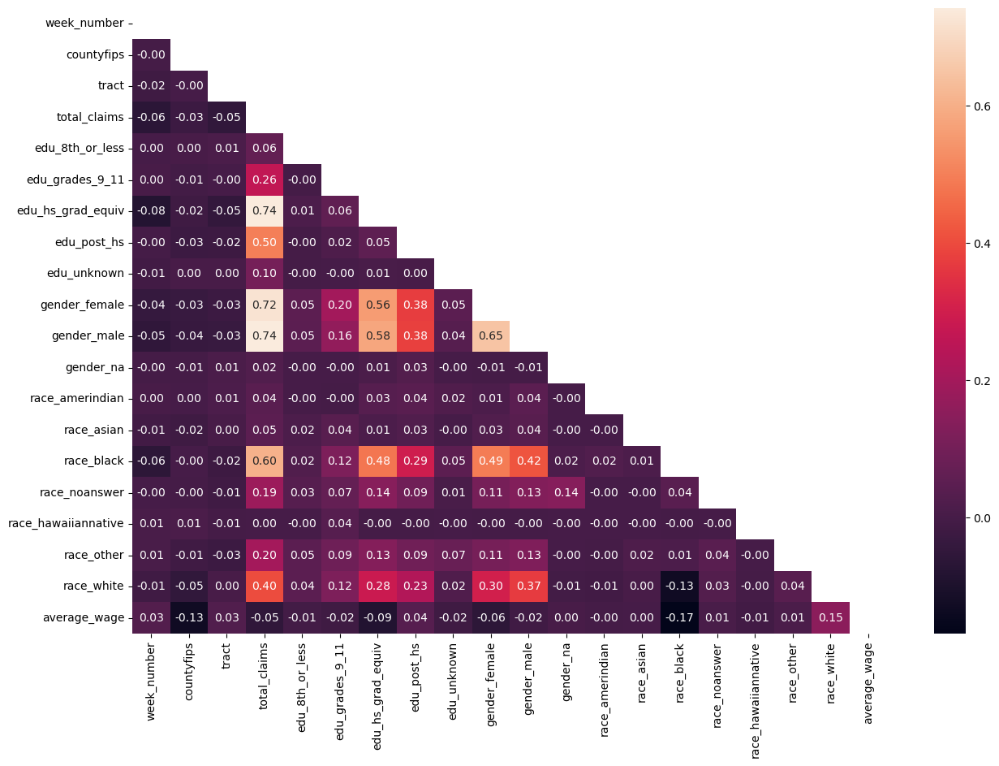

In [8]:
correlation = raw_df.corr(numeric_only=True)
mask = np.triu(np.ones_like(correlation, dtype=bool))
plt.figure(figsize=(15,10))
sns.heatmap(correlation, mask=mask, annot=True, fmt='.2f')

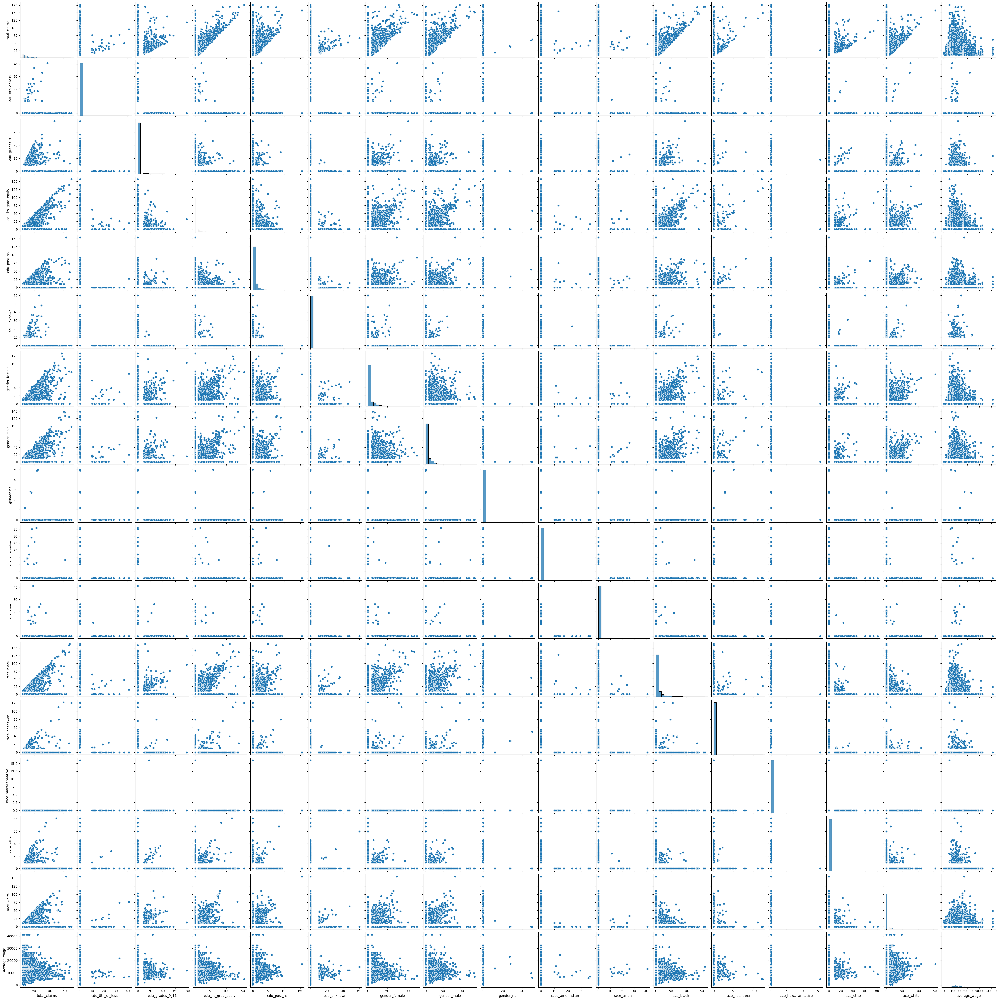

In [9]:
sns.pairplot(data=raw_df, vars= ['total_claims', 'edu_8th_or_less', 'edu_grades_9_11', 'edu_hs_grad_equiv', 'edu_post_hs', 'edu_unknown', 'gender_female', 'gender_male', 'gender_na', 'race_amerindian', 'race_asian', 'race_black', 'race_noanswer',
                                 'race_hawaiiannative', 'race_other', 'race_white', 'average_wage'])

#### Analysis:
There appears to be a linear relationship between total_claims (positive correlation) and a few other variables as seen in the correlation matrix. Distributions are non-uniform, and there are both inlier and outlier datapoints. 

Since this is survey data, answers with no response were logged as a 0 during aggregation, hence the flatlines.

In [10]:
timeline = raw_df[raw_df['tract_name'] == 'Census Tract 17, Tippecanoe County, Indiana']
timeline = timeline.groupby(['date', 'tract_name'], as_index= False,)['total_claims'].sum()

In [11]:
timeline

,date,tract_name,total_claims
0,2022-01-01,"Census Tract 17, Tippecanoe County, Indiana",130
1,2022-01-08,"Census Tract 17, Tippecanoe County, Indiana",190
2,2022-01-15,"Census Tract 17, Tippecanoe County, Indiana",140
3,2022-01-29,"Census Tract 17, Tippecanoe County, Indiana",150
4,2022-02-05,"Census Tract 17, Tippecanoe County, Indiana",240
...,...,...,...
30,2022-08-13,"Census Tract 17, Tippecanoe County, Indiana",330
31,2022-08-20,"Census Tract 17, Tippecanoe County, Indiana",310
32,2022-08-27,"Census Tract 17, Tippecanoe County, Indiana",210
33,2022-09-03,"Census Tract 17, Tippecanoe County, Indiana",210


<AxesSubplot:xlabel='date', ylabel='total_claims'>

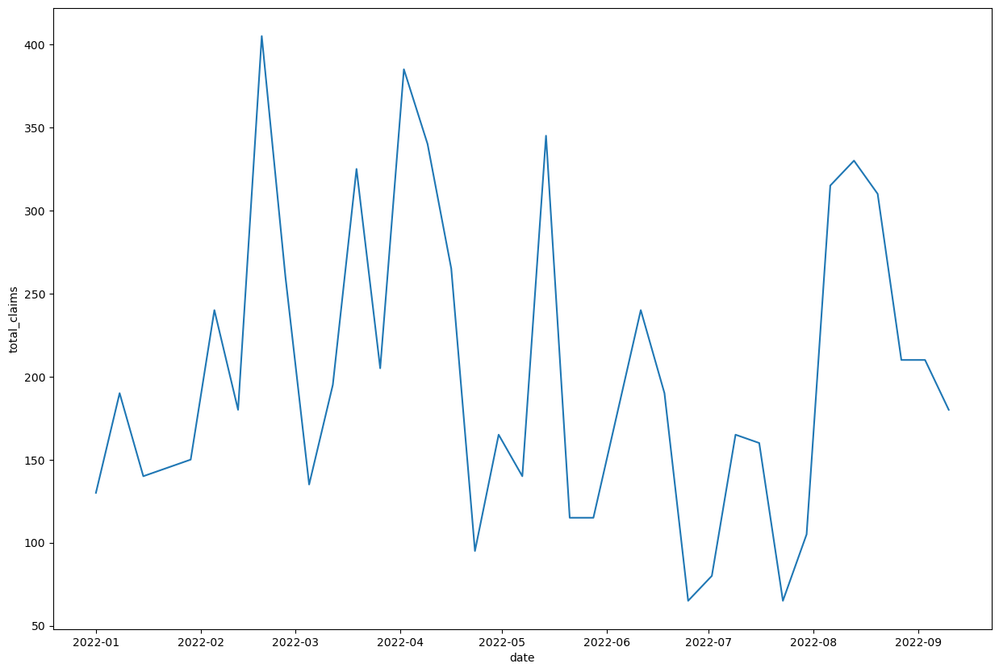

In [12]:
# view of Tippercanoe county
plt.figure(figsize=(15, 10))
sns.lineplot(data=timeline, x= 'date', y = 'total_claims')

In [13]:
# Tippercanoe county - average claims within this tract
timeline_by_week = raw_df[raw_df['tract_name'] == 'Census Tract 17, Tippecanoe County, Indiana']
timeline_by_week = timeline_by_week.groupby(['week_number', 'tract_name'], as_index=False)['total_claims'].mean()

In [14]:
timeline_by_week

,week_number,tract_name,total_claims
0,1,"Census Tract 17, Tippecanoe County, Indiana",26.0
1,2,"Census Tract 17, Tippecanoe County, Indiana",38.0
2,3,"Census Tract 17, Tippecanoe County, Indiana",28.0
3,5,"Census Tract 17, Tippecanoe County, Indiana",30.0
4,6,"Census Tract 17, Tippecanoe County, Indiana",48.0
...,...,...,...
30,33,"Census Tract 17, Tippecanoe County, Indiana",33.0
31,34,"Census Tract 17, Tippecanoe County, Indiana",31.0
32,35,"Census Tract 17, Tippecanoe County, Indiana",21.0
33,36,"Census Tract 17, Tippecanoe County, Indiana",21.0


<AxesSubplot:xlabel='week_number', ylabel='total_claims'>

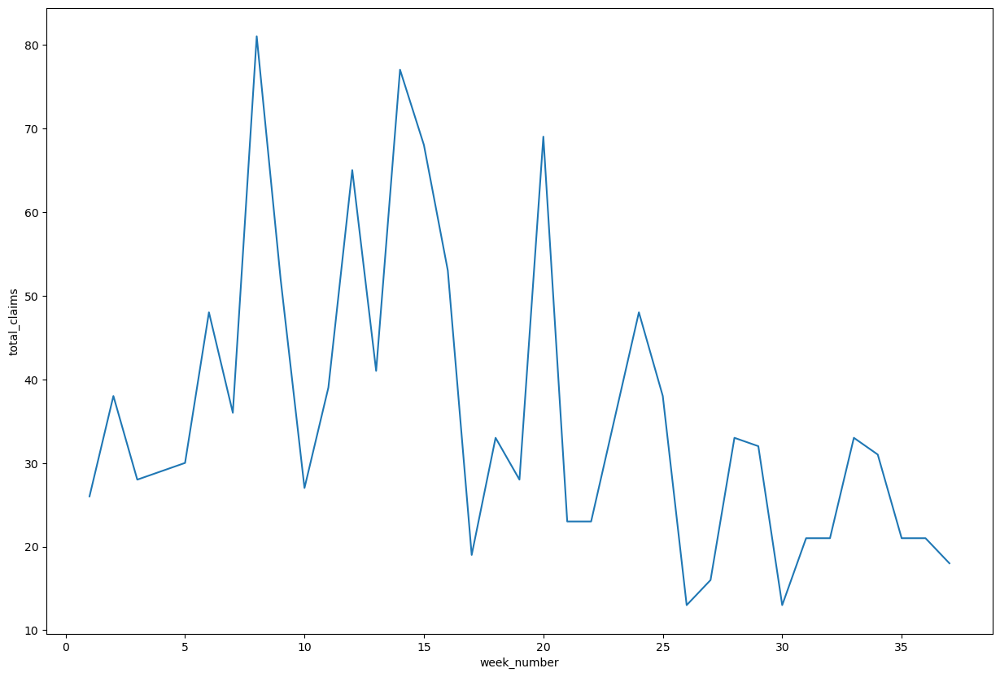

In [15]:
plt.figure(figsize=(15,10))
sns.lineplot(data=timeline_by_week, x='week_number', y='total_claims')

## ML stuff

In [16]:
prediction_list = pd.read_csv('C:\\Users\\ldmag\\Documents\\GitHub\\Code-Assignments-Projects\\Projects\\Ironhacks_Unemployment\\data\\prediction_list.csv', index_col=0)

In [17]:
def evaluate_regressor(prediction_dataframe):
    # Takes in a prediction dataframe of 2 columns, Actual values and Predicted values generated by a regressor
    # Outputs MSE, MAR, RMSE and MAPE metrics. Must have columns named Actual and Predicted.
    print('MSE:', mean_squared_error(prediction_dataframe['Actual'], prediction_dataframe['Predicted']))
    print('MAE:', mean_absolute_error(prediction_dataframe['Actual'], prediction_dataframe['Predicted']))
    print('RMSE:', np.sqrt(mean_squared_error(prediction_dataframe['Actual'], prediction_dataframe['Predicted'])))
    print('MAPE:', np.mean(np.abs((prediction_dataframe['Actual'] - prediction_dataframe['Predicted']) / prediction_dataframe['Actual'])) * 100)

In [18]:
def get_predictions(regressor, model_type, name, week):
    # generates predictions for any model and writes out a dataframe in csv containing them
    # takes a regressor and learning method type as input: DL and ML
    # DL/ML variable basically changes the shape for an input from a 2D array to 3D arry, as required tensor shape
    # NOTE: When calling function, make sure to enter a viable month and day
    result_list = []
    uu_id_transform = LE.fit_transform(prediction_list['uu_id'])
    if model_type == 'DL':
        predict_arr = np.array(SC_other.transform([[0, 1, 6, 4, 4, 5, 0, 1, 2, 0, 0, 4, 1, 4200.0]]))
        for val in uu_id_transform:
            to_predict = np.insert(predict_arr, 0, val, axis=1)
            to_predict = np.insert(to_predict, 1, week, axis=1)
            #to_predict = np.insert(to_predict, 14, month, axis=1)
            #to_predict = np.insert(to_predict, 15, day, axis=1)
            to_predict = np.reshape(to_predict, (to_predict.shape[0], to_predict.shape[1],1))
            r = regressor.predict(to_predict)
            result_list.append(r)
        result_list = np.array(result_list)
        result_list = np.reshape(result_list, (525,))
    elif model_type == 'ML':
        predict_arr = np.array(RB_other.transform([[0, 1, 6, 4, 4, 5, 0, 1, 2, 0, 0, 4, 1, 4200.0]]))
        for val in uu_id_transform:
            to_predict = np.insert(predict_arr, 0, val, axis=1)
            to_predict = np.insert(to_predict, 1, week, axis=1)
            #to_predict = np.insert(to_predict, 14, month, axis=1)
            #to_predict = np.insert(to_predict, 15, day, axis=1)
            r = regressor.predict(to_predict)
            result_list.append(r)
    result_df = pd.DataFrame(result_list, columns = ['Predictions'])
    prediction_sub = prediction_list.copy()
    prediction_sub['total_claims'] = result_df.values
    prediction_sub = prediction_sub[['uu_id','total_claims','week_number']]
    #os.makedirs('lost+found/submission_files', exist_ok=True)
    #prediction_sub.to_csv(name+'.csv', index=False)
    return prediction_sub

In [19]:
def get_pred_frame(test_frame, prediction_array):
    prediction_frame = pd.DataFrame({'Actual': test_frame, 'Predicted': prediction_array.flatten()})
    return prediction_frame

In [20]:
def IsoForest_anomaly(data):
    IFO = IsolationForest(random_state=69)
    col_list = ['week_number', 'total_claims', 'edu_8th_or_less',
                'edu_grades_9_11', 'edu_hs_grad_equiv', 'edu_post_hs', 'gender_female',
                'gender_male', 'race_amerindian', 'race_asian', 'race_black',
                'race_hawaiiannative', 'race_other', 'race_white', 'race_noanswer', 'average_wage']
    NO_df = data.copy()
    IFO.fit(data)
    NO_df['anomaly_scores'] = IFO.decision_function(data)
    NO_df['anomaly'] = IFO.predict(data)
    no_outlier = NO_df[NO_df['anomaly'] == 1]
    print('Removed ', NO_df[NO_df['anomaly'] == -1].shape[0], 'datapoints')
    palette = ['#ff7f0e','#1f77b4']
    sns.pairplot(NO_df, vars = col_list, hue='anomaly', palette=palette)
    no_outlier.drop(['anomaly_scores','anomaly'], axis = 1, inplace=True)
    return no_outlier

In [21]:
def preprocess(data, scaling):
    ## removed granularity (days, months), kept date 

    no_outlierDF = data.copy()
    to_drop = ['tract','top_category_employer1','top_category_employer2',
           'top_category_employer3','countyfips', 'edu_unknown', 'gender_na', 'tract_name', 'date']
    to_scale = ['edu_8th_or_less', 'edu_grades_9_11', 'edu_hs_grad_equiv', 'edu_post_hs', 
            'gender_female', 'gender_male', 'race_amerindian', 'race_asian', 'race_black', 
            'race_hawaiiannative', 'race_other', 'race_white', 'race_noanswer', 'average_wage']
    #no_outlierDF['month'] = no_outlierDF['date'].dt.month
    #no_outlierDF['day'] = no_outlierDF['date'].dt.day
    no_outlierDF.drop(to_drop, axis=1, inplace=True)
    no_outlierDF['uu_id'] = LE.fit_transform(no_outlierDF['uu_id'])
    if scaling == 'Robust':
        no_outlierDF[to_scale] = RB_other.fit_transform(no_outlierDF[to_scale])
    elif scaling == 'Standard':
        no_outlierDF[to_scale] = SC_other.fit_transform(no_outlierDF[to_scale])
    return no_outlierDF

In [22]:
LE = LabelEncoder()
RB_other = RobustScaler()
SC_other = StandardScaler()

In [23]:
clean_df = raw_df.copy()

In [24]:
ML_data = preprocess(clean_df, 'Robust')

In [25]:
ML_data.head(5)

,uu_id,week_number,total_claims,edu_8th_or_less,edu_grades_9_11,edu_hs_grad_equiv,edu_post_hs,gender_female,gender_male,race_amerindian,race_asian,race_black,race_noanswer,race_hawaiiannative,race_other,race_white,average_wage
0,762,17,12,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.480855
1,762,10,14,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.480855
2,762,8,20,0.0,0.0,1.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,0.0,-0.480855
3,762,27,12,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.480855
4,762,12,10,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.480855


Removed  8071 datapoints


C:\Users\ldmag\AppData\Local\Temp\ipykernel_13644\2825902704.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_outlier.drop(['anomaly_scores','anomaly'], axis = 1, inplace=True)


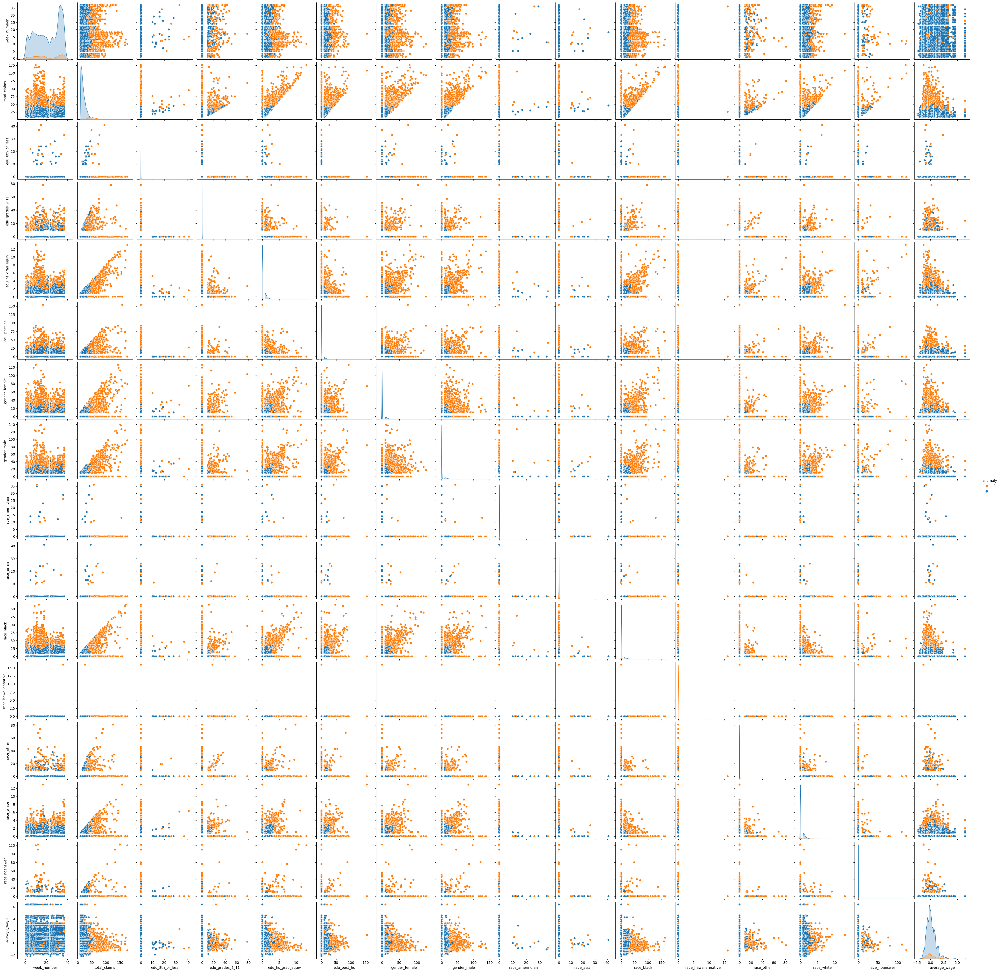

In [26]:
ingest_clean = IsoForest_anomaly(ML_data)

In [27]:
ingest_clean.head(5)

,uu_id,week_number,total_claims,edu_8th_or_less,edu_grades_9_11,edu_hs_grad_equiv,edu_post_hs,gender_female,gender_male,race_amerindian,race_asian,race_black,race_noanswer,race_hawaiiannative,race_other,race_white,average_wage
0,762,17,12,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.480855
1,762,10,14,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.480855
2,762,8,20,0.0,0.0,1.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,0.0,-0.480855
3,762,27,12,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.480855
4,762,12,10,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.480855


In [28]:
Y = ingest_clean['total_claims']
X = ingest_clean[['uu_id', 'week_number', 'edu_8th_or_less',
                 'edu_grades_9_11', 'edu_hs_grad_equiv', 'edu_post_hs', 'gender_female',
                 'gender_male', 'race_amerindian', 'race_asian', 'race_black', 'race_noanswer',
                 'race_hawaiiannative', 'race_other', 'race_white', 'average_wage']]

In [29]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.20, random_state=69)

### Random Forest with Exhaustive Grid Search

In [30]:
'''
%%capture
Regressor_RF = RandomForestRegressor(random_state=69)
search_space = dict()
search_space['n_estimators'] = np.arange(400,700,100)
search_space['criterion'] = ['squared_error','absolute_error']
search_space['max_features'] = ['sqrt',1.0]
GS = GridSearchCV(estimator=Regressor_RF, param_grid=search_space, cv=3, n_jobs=-1, return_train_score=True)

result = GS.fit(X_train,Y_train)
'''

"\n%%capture\nRegressor_RF = RandomForestRegressor(random_state=69)\nsearch_space = dict()\nsearch_space['n_estimators'] = np.arange(400,700,100)\nsearch_space['criterion'] = ['squared_error','absolute_error']\nsearch_space['max_features'] = ['sqrt',1.0]\nGS = GridSearchCV(estimator=Regressor_RF, param_grid=search_space, cv=3, n_jobs=-1, return_train_score=True)\n\nresult = GS.fit(X_train,Y_train)\n"

In [31]:
Regressor_RF_bestFit = RandomForestRegressor(random_state=69, criterion='squared_error', max_features=1.0, n_estimators= 600)
Regressor_RF_bestFit.fit(X_train.values, Y_train.values)

RandomForestRegressor(n_estimators=600, random_state=69)

In [32]:
Y_pred_RFR = Regressor_RF_bestFit.predict(X_test.values).reshape(-1,1)
get_pred_frame(Y_test, Y_pred_RFR)

,Actual,Predicted
31211,27,26.990000
47793,13,13.003333
22461,11,12.320000
41866,16,15.896667
34778,16,15.748333
...,...,...
75853,39,39.000000
2900,10,10.013333
30210,36,35.998333
52913,33,33.000000


In [33]:
evaluate_regressor(get_pred_frame(Y_test, Y_pred_RFR))

MSE: 0.9915490866483035
MAE: 0.29756250934170353
RMSE: 0.9957655781599922
MAPE: 1.8793867369228363


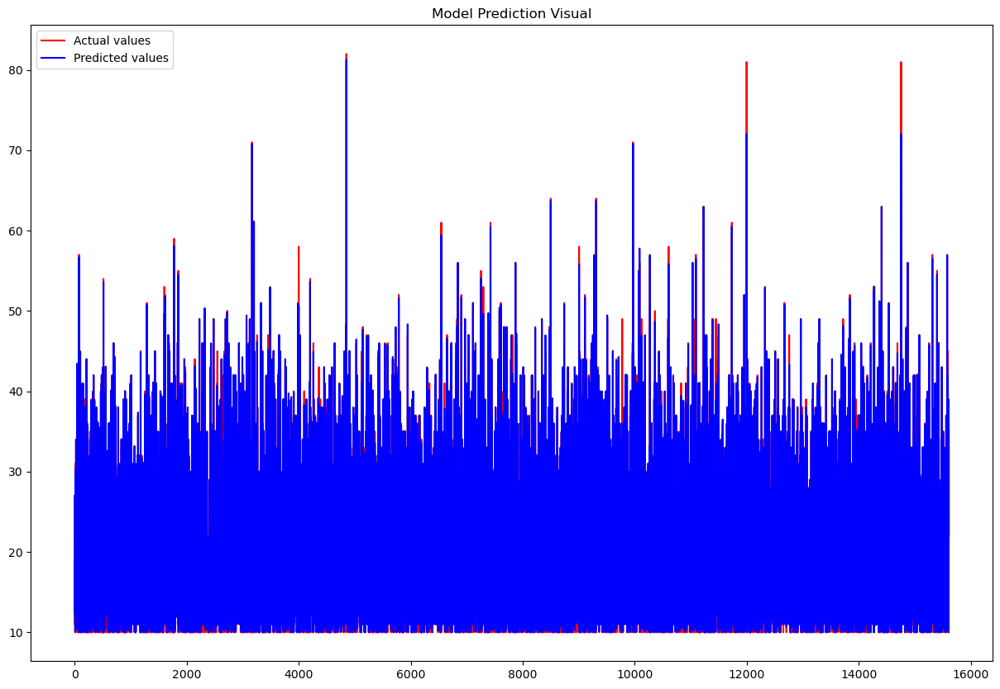

In [34]:
plt.figure(figsize=(15,10))
plt.plot(Y_test.values, color = 'red', label = 'Actual values')
plt.plot(Y_pred_RFR, color='blue', label='Predicted values')
plt.title('Model Prediction Visual')
plt.legend()
plt.show()

In [35]:
get_predictions(Regressor_RF_bestFit, 'ML', 'submission_prediction_output_RFR', 44)

d:\Anaconda\envs\MDL\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RobustScaler was fitted with feature names
  warnings.warn(


,uu_id,total_claims,week_number
0,5bf51fc2e162d6faf9e3cf79e4198378,18.643333,44
1,420b44cc7e3f55d738df565421e59941,18.395000,44
2,e39c66ecceec76ee8f9f811fa4a2d246,16.616667,44
3,a90462cd11ae4e43144239bf7c4828a4,17.768333,44
4,8b20a6749088c7ff1237983076ebfeaa,17.960000,44
...,...,...,...
520,46c4f6c75e663b1ca82ea7994e6d83d3,18.306667,44
521,1deebda501712e7595b531b8337bc31a,20.323333,44
522,5a9758f65f001b6432ff31ff64a459d7,18.640000,44
523,e8b3b95e93a6dc7dbb90f4e72e7ac065,17.173333,44


Note: It appears increasing granularity also increases prediction numbers for each id. I'm not sure why this is happening.

###
Visualizing tracts - experimental

In [36]:
import folium
import geopandas as gpd

In [37]:
clean_df['countyfips'].nunique()

80

In [38]:
countyMaps = gpd.read_file('C:\\Users\\ldmag\\Documents\\GitHub\\Code-Assignments-Projects\\Projects\\Ironhacks_Unemployment\\data\\us-county-boundaries.geojson')
type(countyMaps)

geopandas.geodataframe.GeoDataFrame

In [39]:
countyMapsFull = countyMaps.copy()

In [40]:
countyMaps['countyfips'] = countyMaps['statefp'] + countyMaps['countyfp']

In [41]:
countyMaps.drop(['statefp', 'countyfp', 'geoid'],axis=1, inplace=True)
countyMaps.drop(['countyns', 'namelsad', 'stusab', 'lsad', 'classfp', 'mtfcc',
                 'csafp', 'cbsafp', 'metdivfp', 'funcstat', 'aland', 'aland',
                 'awater', 'state_name', 'countyfp_nozero'], axis = 1, inplace=True)

In [42]:
countyMaps['countyfips'].nunique()

92

There are 12 more counties in the Census sourced dataset. Will have to merge using inner join, using countyfips as the primary key.

The census also contains a 2d lat-long coordinate in case we don't want to use polygons.

countyMaps fips are object datatypes, and the original dataset has fips values as int64.

In [43]:
countyMaps['countyfips'] = countyMaps['countyfips'].astype(np.int64)

In [44]:
#geometry_df = countyMaps[['name', 'countyfips', 'geometry']]

In [45]:
countyMaps.drop(['geometry'], axis=1, inplace=True)

In [46]:
merged_df = pd.merge(clean_df, countyMaps, on='countyfips', how='inner')

In [47]:
merged_df.shape

(86124, 30)

In [48]:
print(clean_df.shape)
print(countyMaps.shape)

(86124, 26)
(92, 5)


In [49]:
merged_df.columns

Index(['uu_id', 'week_number', 'countyfips', 'tract', 'tract_name',
       'total_claims', 'edu_8th_or_less', 'edu_grades_9_11',
       'edu_hs_grad_equiv', 'edu_post_hs', 'edu_unknown',
       'top_category_employer1', 'top_category_employer2',
       'top_category_employer3', 'gender_female', 'gender_male', 'gender_na',
       'race_amerindian', 'race_asian', 'race_black', 'race_noanswer',
       'race_hawaiiannative', 'race_other', 'race_white', 'average_wage',
       'date', 'geo_point_2d', 'name', 'intptlat', 'intptlon'],
      dtype='object')

In [50]:
merged_df['countyfips'].nunique() #check

80

In [51]:
merged_df['name'].unique()

array(['Allen', 'Lake', 'Howard', 'Elkhart', 'Madison', 'DeKalb',
       'Delaware', 'Miami', 'Wabash', 'Warrick', 'Marion', 'LaPorte',
       'Starke', 'Marshall', 'Clark', 'St. Joseph', 'Tippecanoe',
       'Vanderburgh', 'Porter', 'Lawrence', 'LaGrange', 'Greene',
       'Kosciusko', 'Johnson', 'Hamilton', 'Hendricks', 'Grant', 'Vigo',
       'Wayne', 'Clay', 'Posey', 'Cass', 'Owen', 'Knox', 'Tipton',
       'Scott', 'Noble', 'Henry', 'Jasper', 'Monroe', 'Whitley', 'Morgan',
       'Shelby', 'Fulton', 'Dubois', 'Putnam', 'Ripley', 'Hancock',
       'Sullivan', 'Floyd', 'Clinton', 'Fayette', 'Jackson', 'Decatur',
       'Randolph', 'Vermillion', 'Jefferson', 'Blackford', 'Bartholomew',
       'Huntington', 'Washington', 'Jennings', 'Boone', 'Harrison',
       'Steuben', 'Orange', 'Spencer', 'Gibson', 'Crawford', 'Montgomery',
       'Daviess', 'Fountain', 'Adams', 'Parke', 'Wells', 'Rush', 'Newton',
       'Pulaski', 'Carroll', 'Franklin'], dtype=object)

In [52]:
merged_df.drop(['tract_name'], axis=1, inplace=True)

In [53]:
merged_df.columns

Index(['uu_id', 'week_number', 'countyfips', 'tract', 'total_claims',
       'edu_8th_or_less', 'edu_grades_9_11', 'edu_hs_grad_equiv',
       'edu_post_hs', 'edu_unknown', 'top_category_employer1',
       'top_category_employer2', 'top_category_employer3', 'gender_female',
       'gender_male', 'gender_na', 'race_amerindian', 'race_asian',
       'race_black', 'race_noanswer', 'race_hawaiiannative', 'race_other',
       'race_white', 'average_wage', 'date', 'geo_point_2d', 'name',
       'intptlat', 'intptlon'],
      dtype='object')

In [54]:
#geometry_df.columns

In [55]:
# plot for average total_cases
avg_unemp_claims = merged_df.groupby('name', as_index=False)['total_claims'].mean()


In [56]:
avg_unemp_claims

,name,total_claims
0,Adams,19.093023
1,Allen,20.221199
2,Bartholomew,21.965770
3,Blackford,22.375000
4,Boone,18.780172
...,...,...
75,Warrick,16.851648
76,Washington,16.702128
77,Wayne,18.466488
78,Wells,19.941176


In [57]:
# we need data geometries in the above dataframe to display
avg_unemp_claims_geometry = pd.merge(avg_unemp_claims, countyMapsFull, on='name', how='inner')
avg_unemp_claims_geometry.shape

(80, 23)

In [62]:
avg_unemp_claims_geometry.columns

Index(['name', 'total_claims', 'geo_point_2d', 'statefp', 'countyfp',
       'countyns', 'geoid', 'namelsad', 'stusab', 'lsad', 'classfp', 'mtfcc',
       'csafp', 'cbsafp', 'metdivfp', 'funcstat', 'aland', 'awater',
       'intptlat', 'intptlon', 'state_name', 'countyfp_nozero', 'geometry'],
      dtype='object')

In [59]:
# test
area = folium.Map(location = [40.388619,-86.894097], default_zoom_start = .5)
folium.Choropleth(geo_data= countyMapsFull, data= avg_unemp_claims, name='choropleth',
                columns=['name', 'total_claims'], key_on='feature.properties.name',
                fill_color='YlGn', fill_opacity=0.7, line_opacity=0.2).add_to(area)
area

In [63]:
# interactivity test - failed, will need to engineer a better dataframe
average_cases = folium.features.GeoJson(avg_unemp_claims_geometry, 
                                        style_function = lambda x: {'color':'transparent',
                                        'fillColor': 'transparent', 'weight':0},
                                        highlight_function = lambda x: {'fillColor': '#000000',
                                        'color':'#000000', 'fillOpacity':'0.50', 'weight':0.1},
                                        tooltip = folium.features.GeoJsonTooltip(fields=['name', 'total_claims'],
                                        labels = True, sticky=False))
area.add_child(average_cases)
area.keep_in_front(average_cases)
folium.LayerControl().add_to(area)

area

ValueError: Cannot render objects with any missing geometries:            name  total_claims                           geo_point_2d statefp  \
0         Adams     19.093023   {'lon': -84.936655, 'lat': 40.74566}      18   
1         Allen     20.221199  {'lon': -85.066562, 'lat': 41.090871}      18   
2   Bartholomew     21.965770  {'lon': -85.897603, 'lat': 39.205971}      18   
3     Blackford     22.375000   {'lon': -85.32482, 'lat': 40.473601}      18   
4         Boone     18.780172  {'lon': -86.468696, 'lat': 40.050801}      18   
..          ...           ...                                    ...     ...   
75      Warrick     16.851648  {'lon': -87.272054, 'lat': 38.092166}      18   
76   Washington     16.702128  {'lon': -86.105306, 'lat': 38.599984}      18   
77        Wayne     18.466488  {'lon': -85.009876, 'lat': 39.864416}      18   
78        Wells     19.941176   {'lon': -85.22122, 'lat': 40.729187}      18   
79      Whitley     17.540984  {'lon': -85.505118, 'lat': 41.139375}      18   

   countyfp  countyns  geoid            namelsad stusab lsad  ... cbsafp  \
0       001  00450401  18001        Adams County     IN   06  ...  19540   
1       003  00450402  18003        Allen County     IN   06  ...  23060   
2       005  00451683  18005  Bartholomew County     IN   06  ...  18020   
3       009  00450404  18009    Blackford County     IN   06  ...   None   
4       011  00450405  18011        Boone County     IN   06  ...  26900   
..      ...       ...    ...                 ...    ...  ...  ...    ...   
75      173  00450335  18173      Warrick County     IN   06  ...  21780   
76      175  00451665  18175   Washington County     IN   06  ...  31140   
77      177  00450336  18177        Wayne County     IN   06  ...  39980   
78      179  00450337  18179        Wells County     IN   06  ...   None   
79      183  00450369  18183      Whitley County     IN   06  ...  23060   

   metdivfp funcstat       aland    awater     intptlat      intptlon  \
0      None        A   877815499   2693924  +40.7457327  -084.9361303   
1      None        A  1702451597   7002354  +41.0919086  -085.0717907   
2      None        A  1054009620   6674332  +39.2058430  -085.8979988   
3      None        A   427559407   1298757  +40.4726717  -085.3237297   
4      None        A  1095336920    877155  +40.0508916  -086.4690137   
..      ...      ...         ...       ...          ...           ...   
75     None        A   996664711  16155579  +38.0977282  -087.2720486   
76     None        A  1330454436   7530005  +38.6006126  -086.1047512   
77     None        A  1040539262   6701983  +39.8630908  -085.0067351   
78     None        A   953341278   5596377  +40.7352727  -085.2129742   
79     None        A   869152583   6041913  +41.1364261  -085.5018918   

    state_name countyfp_nozero  \
0      Indiana               1   
1      Indiana               3   
2      Indiana               5   
3      Indiana               9   
4      Indiana              11   
..         ...             ...   
75     Indiana             173   
76     Indiana             175   
77     Indiana             177   
78     Indiana             179   
79     Indiana             183   

                                             geometry  
0   POLYGON ((-85.07220 40.83091, -85.07226 40.830...  
1   POLYGON ((-85.19209 41.26421, -85.19115 41.264...  
2   POLYGON ((-86.08168 39.21938, -86.08169 39.219...  
3   POLYGON ((-85.44583 40.47930, -85.44586 40.480...  
4   POLYGON ((-86.58119 40.17770, -86.58106 40.177...  
..                                                ...  
75  POLYGON ((-87.35514 38.20162, -87.35002 38.201...  
76  POLYGON ((-86.30775 38.64446, -86.30796 38.649...  
77  POLYGON ((-85.20095 39.87380, -85.20095 39.873...  
78  POLYGON ((-85.22339 40.91698, -85.22078 40.916...  
79  POLYGON ((-85.65207 41.20750, -85.65205 41.208...  

[80 rows x 23 columns]